# **Google Deep Dream in PyTorch**

---

Nesta lição, aprenderemos a implementar o **Algoritmo Google Deep Dream** usando PyTorch. Este método foi introduzido pela primeira vez por Alexander Mordvintsev, do Google, em julho de 2015.

Ele nos permite fornecer o efeito “Deep Dream”, que produz visuais semelhantes a alucinações. 

Neste tutorial, nós:

1. Carregamos módulos e a rede VGG pré-treinada
2. Obtemos os canais de saída de uma camada e executamos nosso algoritmo Deep Dream
3. Melhoramos o Deep Dream executando-o em diferentes escalas
4. Implementamos o Deep Dream direcionado

Traduzido com a versão gratuita do tradutor - DeepL.com

## **1. Carregar módulos e rede VGG pré-treinada**

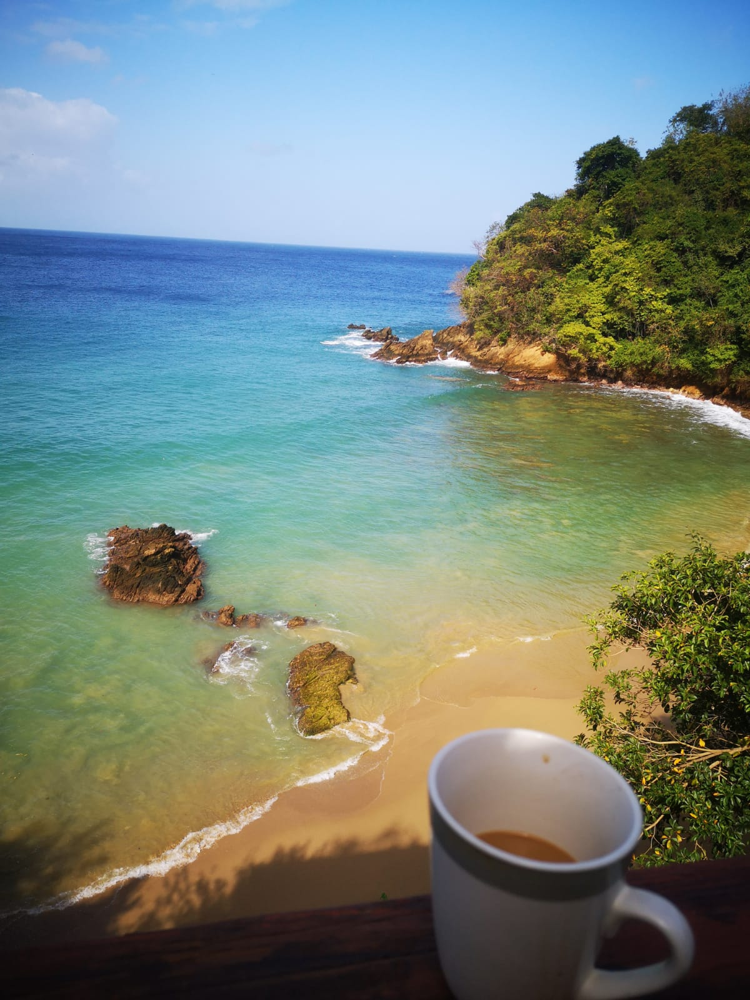

In [14]:
import numpy as np
import torch
import torch.nn as nn
from torchvision import transforms
import torchvision.models as models

from PIL import Image, ImageFilter, ImageChops
import matplotlib.pyplot as plt

import requests
from io import BytesIO

vgg = models.vgg16(pretrained = True)
vgg = vgg.cuda()
vgg.eval()

#Input image
url = 'https://github.com/rajeevratan84/ModernComputerVision/raw/main/castara-tobago.jpeg'
response = requests.get(url)
img = Image.open(BytesIO(response.content))

from IPython.display import Image as Img

display(img)

## **2. Obtenha os canais de saída de uma camada**

Obtenha os canais de saída de uma camada e calcule os gradientes a partir de sua norma L2. Use esses dados para atualizar a imagem de entrada, mas movendo seus parâmetros na direção do gradiente (em vez de contra ele). Repita!

https://www.kaggle.com/sironghuang/understanding-pytorch-hooks

In [ ]:
from PIL import Image
# # Registre um hook na camada de destino (usado para obter os canais de saída da camada)
class Hook():
    def __init__(self, module, backward=False):
        if backward==False:
            self.hook = module.register_forward_hook(self.hook_fn)
        else:
            self.hook = module.register_backward_hook(self.hook_fn)
    def hook_fn(self, module, input, output):
        self.input = input
        self.output = output
    def close(self):
        self.hook.remove()
  
# Faça cálculos de gradientes a partir dos canais de saída da camada de destino   
def get_gradients(net_in, net, layer):     
  net_in = net_in.unsqueeze(0).cuda()
  net_in.requires_grad = True
  net.zero_grad()
  hook = Hook(layer)
  net_out = net(net_in)
  loss = hook.output[0].norm()
  loss.backward()
  return net_in.grad.data.squeeze()

# Denormalization image transform
denorm = transforms.Compose([ transforms.Normalize(mean = [ 0., 0., 0. ], std = [ 1/0.229, 1/0.224, 1/0.225 ]),                 
                              transforms.Normalize(mean = [ -0.485, -0.456, -0.406 ], std = [ 1., 1., 1. ]),                                                     
                              ])

def dream(image, net, layer, iterations, lr):
  image_tensor = transforms.ToTensor()(image)
  image_tensor = transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])(image_tensor).cuda()
  for i in range(iterations):
    gradients = get_gradients(image_tensor, net, layer)
    image_tensor.data = image_tensor.data + lr * gradients.data

  img_out = image_tensor.detach().cpu()
  img_out = denorm(img_out)
  img_out_np = img_out.numpy().transpose(1,2,0)
  img_out_np = np.clip(img_out_np, 0, 1)
  img_out_pil = Image.fromarray(np.uint8(img_out_np * 255))
  return img_out_pil

### **Rodando nossa primeira versão do Google Deep Dream**

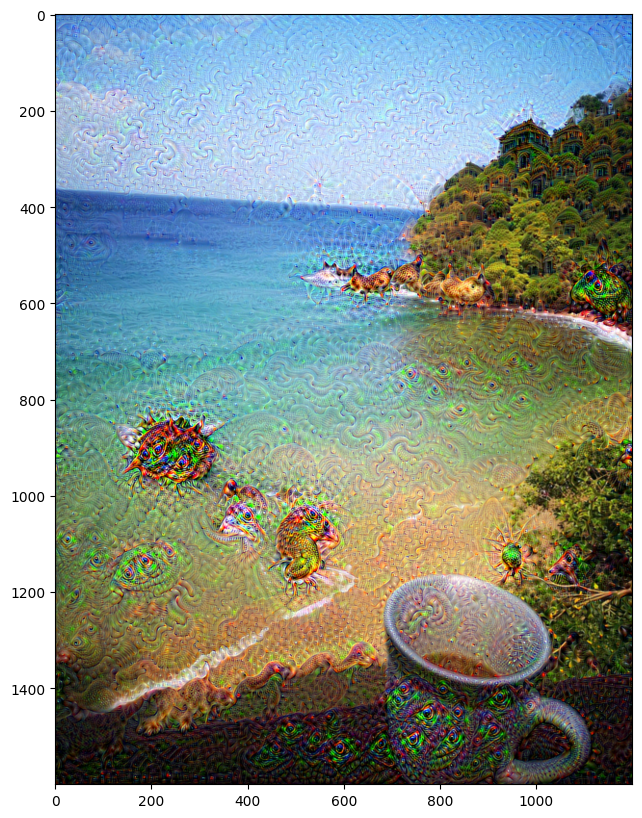

In [17]:
orig_size = np.array(img.size)
new_size = np.array(img.size)*0.5
img = img.resize(new_size.astype(int))
layer = list( vgg.features.modules() )[27]

img = dream(img, vgg, layer, 20, 1)

img = img.resize(orig_size)
fig = plt.figure(figsize = (10 , 10))
plt.imshow(img)

## **Melhorando o Deep Dream**

Vemos que os padrões têm a mesma escala e que o efeito deep dream fica mais acentuado na imagem de baixa resolução. 

Uma atualização do código anterior consiste em executar a função dream repetidamente, mas sempre com a imagem redimensionada para uma escala diferente.

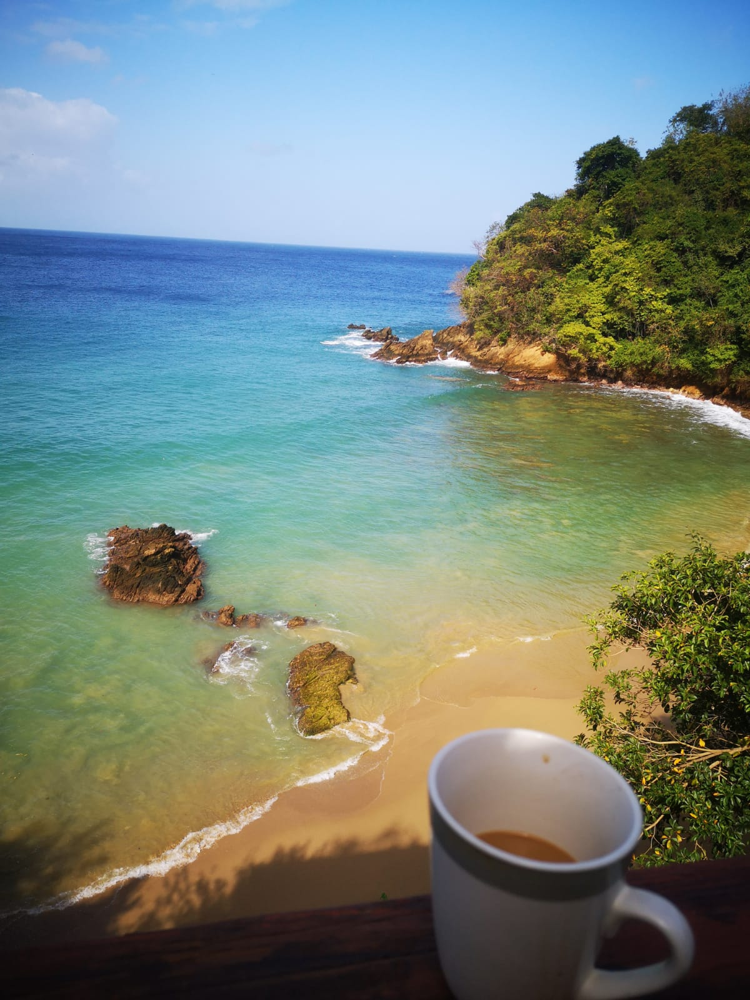

In [18]:
# Faça cálculos de gradientes a partir dos canais de saída da camada de destino.
# É possível selecionar quais canais de saída da camada podem ser usados.
def get_gradients(net_in, net, layer, out_channels = None):     
  net_in = net_in.unsqueeze(0).cuda()
  net_in.requires_grad = True
  net.zero_grad()
  hook = Hook(layer)
  net_out = net(net_in)
  if out_channels == None:
    loss = hook.output[0].norm()
  else:
    loss = hook.output[0][out_channels].norm()
  loss.backward()
  return net_in.grad.data.squeeze()

# As conversões excessivas de e para matrizes numpy têm como objetivo utilizar a função np.roll().
# Ao rolar a imagem aleatoriamente sempre que os gradientes são calculados, evitamos que apareça um artefato de efeito de mosaico.
def dream(image, net, layer, iterations, lr, out_channels = None):
  image_numpy = np.array(image)
  image_tensor = transforms.ToTensor()(image_numpy)
  image_tensor = transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])(image_tensor).cuda()
  denorm = transforms.Compose([ transforms.Normalize(mean = [ 0., 0., 0. ], std = [ 1/0.229, 1/0.224, 1/0.225 ]),                 
                                transforms.Normalize(mean = [ -0.485, -0.456, -0.406 ], std = [ 1., 1., 1. ]),                                                     
                               ])
  for i in range(iterations):
    roll_x = np.random.randint(image_numpy.shape[0])
    roll_y = np.random.randint(image_numpy.shape[1])
    img_roll = np.roll(np.roll(image_tensor.detach().cpu().numpy().transpose(1,2,0), roll_y, 0), roll_x, 1) #lista circular
    img_roll_tensor = torch.tensor(img_roll.transpose(2,0,1), dtype = torch.float)
    gradients_np = get_gradients(img_roll_tensor, net, layer, out_channels).detach().cpu().numpy()
    gradients_np = np.roll(np.roll(gradients_np, -roll_y, 1), -roll_x, 2)
    gradients_tensor = torch.tensor(gradients_np).cuda()
    image_tensor.data = image_tensor.data + lr * gradients_tensor.data

  img_out = image_tensor.detach().cpu()
  img_out = denorm(img_out)
  img_out_np = img_out.numpy()
  img_out_np = img_out_np.transpose(1,2,0)
  img_out_np = np.clip(img_out_np, 0, 1)
  img_out_pil = Image.fromarray(np.uint8(img_out_np * 255))
  return img_out_pil

# Input image
url = 'https://github.com/rajeevratan84/ModernComputerVision/raw/main/castara-tobago.jpeg'
response = requests.get(url)
img = Image.open(BytesIO(response.content))
orig_size = np.array(img.size)
new_size = np.array(img.size)*0.5
#img = img.resize(new_size.astype(int))
layer = list( vgg.features.modules() )[27]

from IPython.display import Image as Img

display(img)

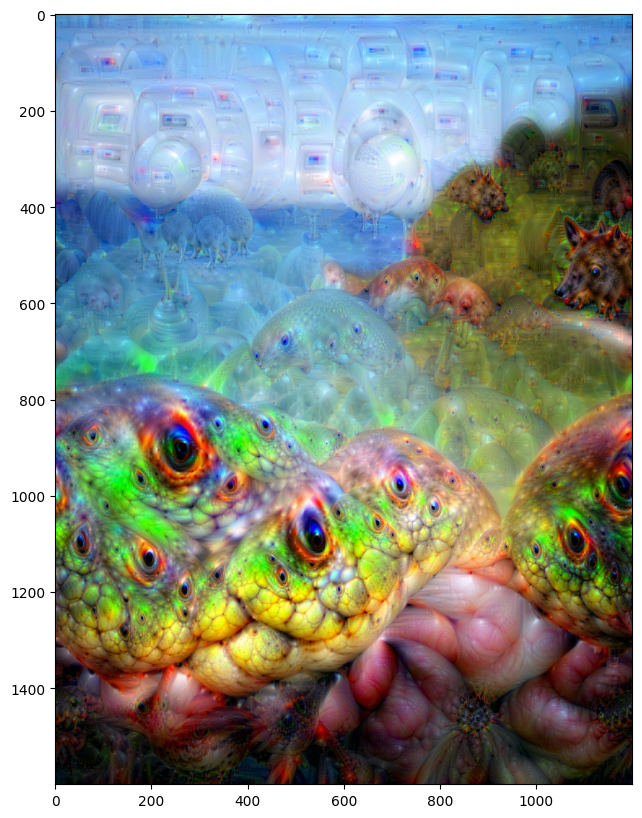

In [20]:
# Visualize as features em diferentes escalas, a imagem é redimensionada várias vezes e executada através do deep dream.
OCTAVE_SCALE = 1.5
for n in range(-7,1):
  new_size = orig_size * (OCTAVE_SCALE**n)
  img = img.resize(new_size.astype(int), Image.BILINEAR)
  img = dream(img, vgg, layer, 50, 0.05, out_channels = None)

img = img.resize(orig_size)
fig = plt.figure(figsize = (10 , 10))
plt.imshow(img)

## **3. Direcionando a alucinação**

Aqui, orientamos o dream usando uma imagem-alvo com características que gostaríamos de visualizar em nossa imagem de entrada.

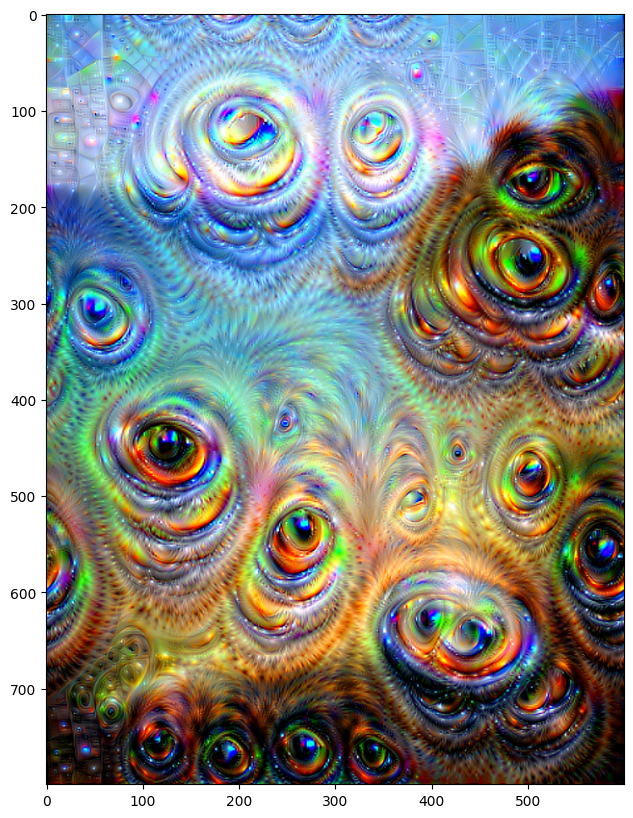

In [25]:
def objective_guide(dst, guide_features):
    '''Our objective guide function'''
    x = dst.data[0].cpu().numpy().copy()
    y = guide_features.data[0].cpu().numpy()
    ch, w, h = x.shape

    x = x.reshape(ch,-1)
    y = y.reshape(ch,-1)
    A = x.T.dot(y) # calcular a matriz dos produtos escalares com as features-guia
    result = y[:,A.argmax(1)] # selecione as que melhor correspondem
    result = torch.Tensor(np.array([result.reshape(ch, w, h)], dtype=np.float32)).cuda()
    return result        

# Agora podemos ter as features-guia como entrada
def get_gradients(net_in, net, layer, control = False, guide_features = None):     
  net_in = net_in.unsqueeze(0).cuda()
  net_in.requires_grad = True
  net.zero_grad()
  hook = Hook(layer)
  net_out = net(net_in)
  if control:
    params = objective_guide(hook.output, guide_features)[0]
  else:
    params = hook.output[0]
  hook.output[0].backward( params )
  return net_in.grad.data.squeeze()
  
def dream(image, net, layer, iterations, lr, control = False, guide_features = None):
  image_numpy = np.array(image)
  image_tensor = transforms.ToTensor()(image_numpy)
  image_tensor = transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])(image_tensor).cuda()
  denorm = transforms.Compose([ transforms.Normalize(mean = [ 0., 0., 0. ], std = [ 1/0.229, 1/0.224, 1/0.225 ]),                 
                                transforms.Normalize(mean = [ -0.485, -0.456, -0.406 ], std = [ 1., 1., 1. ]),                                                     
                               ])
  for i in range(iterations):
    roll_x = np.random.randint(image_numpy.shape[0])
    roll_y = np.random.randint(image_numpy.shape[1])
    img_roll = np.roll(np.roll(image_tensor.detach().cpu().numpy().transpose(1,2,0), roll_y, 0), roll_x, 1)
    img_roll_tensor = torch.tensor(img_roll.transpose(2,0,1), dtype = torch.float)
    gradients_np = get_gradients(img_roll_tensor, net, layer, control, guide_features).detach().cpu().numpy()
    gradients_np = np.roll(np.roll(gradients_np, -roll_y, 1), -roll_x, 2)
    ratio = np.abs(gradients_np.mean())
    lr_ = lr / ratio
    lr_ = lr
    gradients_tensor = torch.tensor(gradients_np).cuda()
    image_tensor.data = image_tensor.data + lr_ * gradients_tensor.data
  img_out = image_tensor.detach().cpu()
  img_out = denorm(img_out)
  img_out_np = img_out.numpy()
  img_out_np = img_out_np.transpose(1,2,0)
  img_out_np = np.clip(img_out_np, 0, 1)
  img_out_pil = Image.fromarray(np.uint8(img_out_np * 255))
  return img_out_pil

layer = list( vgg.features.modules() )[23]

# extract target features
url_guide_features = "https://www.allfordogs.org/wp-content/uploads/2018/05/many-dog-faces.jpg"
response = requests.get(url_guide_features)
features_img = Image.open(BytesIO(response.content))
new_size = np.array(features_img.size)*1.5
features_img = features_img.resize(new_size.astype(int))

img_np = np.array(features_img)
img_tensor = transforms.ToTensor()(img_np)
hook = Hook(layer)
net_out = vgg(img_tensor.unsqueeze(0).cuda())
guide_features = hook.output

#input image
url = "https://github.com/rajeevratan84/ModernComputerVision/raw/main/castara-tobago.jpeg"
response = requests.get(url)
img = Image.open(BytesIO(response.content))
new_size = np.array(img.size)*0.5
img = img.resize(new_size.astype(int))
og_size = np.array(img.size)

OCTAVE_SCALE = 1.3
for n in range(-7,0):
  new_size = og_size * (OCTAVE_SCALE**n)
  img = img.resize(new_size.astype(int), Image.BILINEAR)
  img = dream(img, vgg, layer, 100, 0.00005, control = True, guide_features = guide_features)

img = img.resize(og_size)
fig = plt.figure(figsize = (10 , 10))
plt.imshow(img)